# Feature engineering
Our dataset is about the analysis of patients data based on mulitple attributes like air polluiton/ genetic rink/ age/ gender and so on and the likelihood of being diagnosed of cancer based on their 'level' variable.

In [1]:
#Import relevant packages

!pip install openpyxl
import numpy as np
import pandas as pd
import seaborn as sns
import pandas_profiling as pp 
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt #visualization
import seaborn as sns #visualization

In [2]:
#Reading our excel file using pandas
df= pd.read_excel('/Users/pree/Desktop/cancer_dataset.xlsx')

In [3]:
#First look of our dataframe
df.head()

,Patient Id,Age,Gender,Air Pollution,Alcohol use,Dust Allergy,OccuPational Hazards,Genetic Risk,chronic Lung Disease,Balanced Diet,...,Fatigue,Weight Loss,Shortness of Breath,Wheezing,Swallowing Difficulty,Clubbing of Finger Nails,Frequent Cold,Dry Cough,Snoring,Level
0,P1,33.0,1.0,2.0,4.0,5.0,4.0,3.0,2,2.0,...,3.0,4.0,2.0,2.0,3.0,1.0,2.0,3,4,Low
1,P10,17.0,1.0,3.0,1.0,5.0,3.0,4.0,2,2.0,...,1.0,3.0,7.0,8.0,6.0,2.0,1.0,7,2,Medium
2,P100,35.0,1.0,4.0,5.0,6.0,5.0,5.0,4,6.0,...,8.0,7.0,9.0,2.0,1.0,4.0,6.0,7,2,High
3,P1000,37.0,1.0,7.0,7.0,7.0,7.0,6.0,7,7.0,...,4.0,2.0,3.0,1.0,4.0,5.0,6.0,7,5,High
4,P101,46.0,1.0,6.0,8.0,7.0,7.0,7.0,6,7.0,...,3.0,NaN,4.0,1.0,4.0,2.0,4.0,2,3,High


In [4]:
#Analyzing the number of rows and columns
df.shape

(1000, 25)

In [5]:
#Checking the number of observations/ Non Null/ Data types of our variables
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Patient Id                1000 non-null   object 
 1   Age                       997 non-null    float64
 2   Gender                    994 non-null    float64
 3   Air Pollution             991 non-null    float64
 4   Alcohol use               988 non-null    float64
 5   Dust Allergy              993 non-null    float64
 6   OccuPational Hazards      994 non-null    float64
 7   Genetic Risk              994 non-null    float64
 8   chronic Lung Disease      1000 non-null   int64  
 9   Balanced Diet             995 non-null    float64
 10  Obesity                   992 non-null    float64
 11  Smoking                   993 non-null    float64
 12  Passive Smoker            996 non-null    float64
 13  Chest Pain                992 non-null    float64
 14  Coughing 

# Descriptive Analysis

In [6]:
#Getting a picture of the counts/mean/std/min/IQR/max
df.describe()

,Age,Gender,Air Pollution,Alcohol use,Dust Allergy,OccuPational Hazards,Genetic Risk,chronic Lung Disease,Balanced Diet,Obesity,...,Coughing of Blood,Fatigue,Weight Loss,Shortness of Breath,Wheezing,Swallowing Difficulty,Clubbing of Finger Nails,Frequent Cold,Dry Cough,Snoring
count,997.000000,994.000000,991.000000,988.000000,993.000000,994.000000,994.000000,1000.000000,995.000000,992.000000,...,987.000000,995.000000,995.000000,990.000000,994.000000,993.000000,996.000000,997.000000,1000.000000,1000.000000
mean,37.185557,1.400402,3.837538,4.577935,5.225579,4.837022,4.583501,4.380000,5.184925,4.476815,...,4.867275,4.081407,3.887437,4.240404,3.794769,3.749245,3.928715,3.535607,3.853000,2.926000
std,12.003960,0.490227,2.032276,2.619582,2.767079,2.107293,2.125842,1.848518,22.152435,2.127962,...,2.426947,7.271704,2.287089,2.288756,2.051731,2.271528,2.390504,1.830681,2.039007,1.474686
min,14.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,28.000000,1.000000,2.000000,2.000000,4.000000,3.000000,2.250000,3.000000,2.000000,3.000000,...,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
50%,36.000000,1.000000,3.000000,5.000000,6.000000,5.000000,5.000000,4.000000,4.000000,4.000000,...,4.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000
75%,45.000000,2.000000,6.000000,7.000000,7.000000,7.000000,7.000000,6.000000,7.000000,7.000000,...,7.000000,5.000000,6.000000,6.000000,5.000000,5.000000,5.000000,5.000000,6.000000,4.000000
max,73.000000,2.000000,8.000000,8.000000,66.000000,8.000000,7.000000,7.000000,700.000000,7.000000,...,9.000000,222.000000,20.000000,9.000000,11.000000,8.000000,9.000000,7.000000,7.000000,7.000000


# Visualizing our missing values with a heatmap

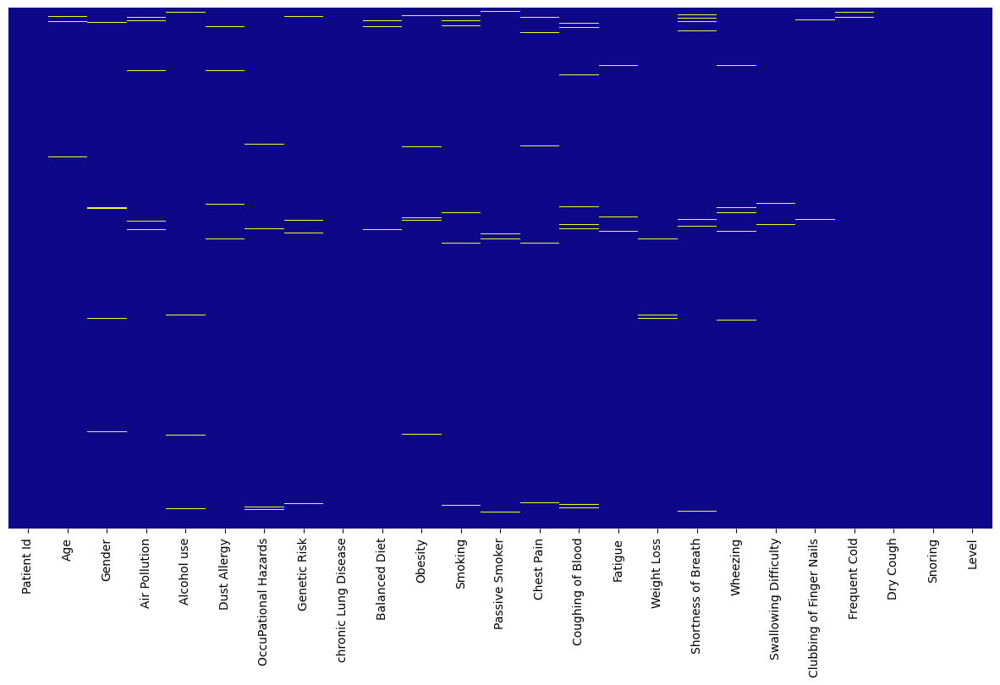

In [8]:
#Visualizing the missing values in the dataframe using a heatmap
plt.figure(figsize=(15,8))
sns.heatmap(yticklabels=False, data=df.isnull(), cbar=False, cmap="plasma")
plt.show() 

In [9]:
#Checking for the exact number of observations with null values
df.isnull().sum()
# for % of null use : the above with * 100 / len(df)

Patient Id                   0
Age                          3
Gender                       6
Air Pollution                9
Alcohol use                 12
Dust Allergy                 7
OccuPational Hazards         6
Genetic Risk                 6
chronic Lung Disease         0
Balanced Diet                5
Obesity                      8
Smoking                      7
Passive Smoker               4
Chest Pain                   8
Coughing of Blood           13
Fatigue                      5
Weight Loss                  5
Shortness of Breath         10
Wheezing                     6
Swallowing Difficulty        7
Clubbing of Finger Nails     4
Frequent Cold                3
Dry Cough                    0
Snoring                      0
Level                        0
dtype: int64

# After the manual analysis, lets run an Autoviz analysis on our raw dataset

1. It gives us a complete picture of our dataset icluding 
a.Pair plots of the combinations of columns in pairs
b.Distribution/ box / skewness of each of our columns



In [10]:
#plt.figure(figsize = (10, 5))
#from autoviz.AutoViz_Class import AutoViz_Class
#AV = AutoViz_Class()
#df_av = AV.AutoViz('/Users/pree/Desktop/cancer_dataset.xlsx') 
#plt.show() 

# 2.Distplot/ Boxplot/ Probability (skew) Plots of the whole dataset

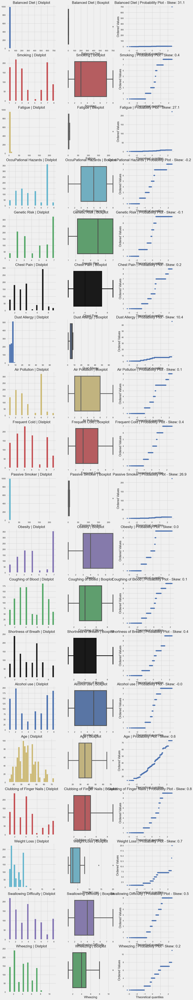

# 3. Violin plots of all continuous variables

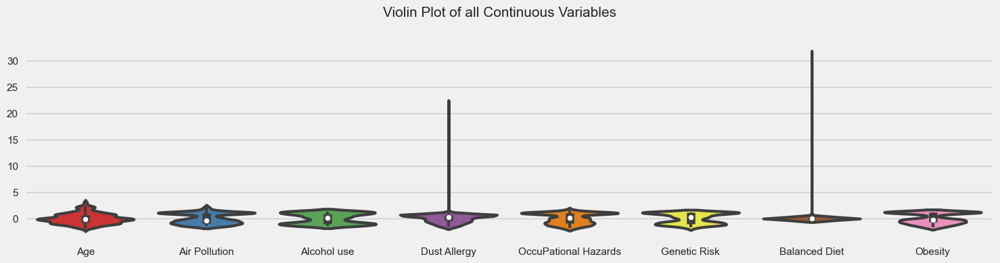

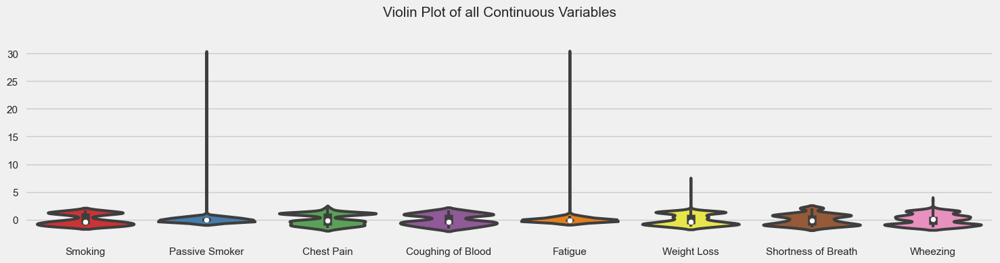

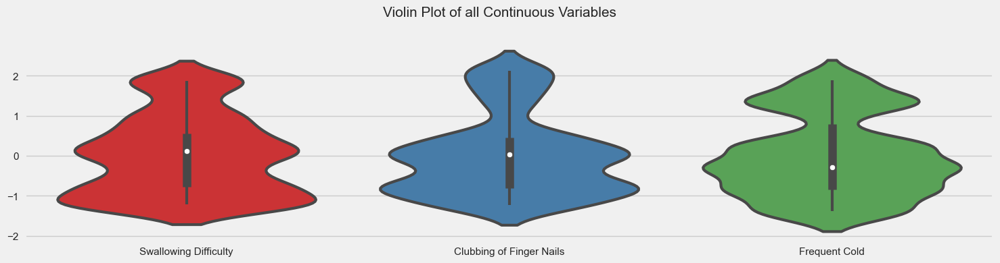

# Now after getting a solid understanding of our raw data, we can step into cleaning our data for better analysis

In [11]:
#As noticed, we will convert all our columns to lowercase to make it homogenous and easy to work with
df.columns= df.columns.str.lower()
df.columns

Index(['patient id', 'age', 'gender', 'air pollution', 'alcohol use',
       'dust allergy', 'occupational hazards', 'genetic risk',
       'chronic lung disease', 'balanced diet', 'obesity', 'smoking',
       'passive smoker', 'chest pain', 'coughing of blood', 'fatigue',
       'weight loss', 'shortness of breath', 'wheezing',
       'swallowing difficulty', 'clubbing of finger nails', 'frequent cold',
       'dry cough', 'snoring', 'level'],
      dtype='object')

In [12]:
#We will then replace all the empty spaces between the variable names with an underscore
df.columns = df.columns.str.replace(' ', '_')
df.columns

Index(['patient_id', 'age', 'gender', 'air_pollution', 'alcohol_use',
       'dust_allergy', 'occupational_hazards', 'genetic_risk',
       'chronic_lung_disease', 'balanced_diet', 'obesity', 'smoking',
       'passive_smoker', 'chest_pain', 'coughing_of_blood', 'fatigue',
       'weight_loss', 'shortness_of_breath', 'wheezing',
       'swallowing_difficulty', 'clubbing_of_finger_nails', 'frequent_cold',
       'dry_cough', 'snoring', 'level'],
      dtype='object')

In [13]:
df.head()

,patient_id,age,gender,air_pollution,alcohol_use,dust_allergy,occupational_hazards,genetic_risk,chronic_lung_disease,balanced_diet,...,fatigue,weight_loss,shortness_of_breath,wheezing,swallowing_difficulty,clubbing_of_finger_nails,frequent_cold,dry_cough,snoring,level
0,P1,33.0,1.0,2.0,4.0,5.0,4.0,3.0,2,2.0,...,3.0,4.0,2.0,2.0,3.0,1.0,2.0,3,4,Low
1,P10,17.0,1.0,3.0,1.0,5.0,3.0,4.0,2,2.0,...,1.0,3.0,7.0,8.0,6.0,2.0,1.0,7,2,Medium
2,P100,35.0,1.0,4.0,5.0,6.0,5.0,5.0,4,6.0,...,8.0,7.0,9.0,2.0,1.0,4.0,6.0,7,2,High
3,P1000,37.0,1.0,7.0,7.0,7.0,7.0,6.0,7,7.0,...,4.0,2.0,3.0,1.0,4.0,5.0,6.0,7,5,High
4,P101,46.0,1.0,6.0,8.0,7.0,7.0,7.0,6,7.0,...,3.0,NaN,4.0,1.0,4.0,2.0,4.0,2,3,High


# Checking for duplicates

In [14]:
#Checking for duplicate values
df.duplicated().sum()

0

# Now that our data is structured/ deduplicated/ missing valaues and outliers identified, let's run a correlation map on our dataset. But in order to do that we will need to convert our target variable 'level' from categorical data to numeric data. We will achieve this by using Label Encoder from sklearn preprocessing

In [15]:
from sklearn.preprocessing import LabelEncoder

#Lets check unique values of the target variable
df['level'].unique()

array(['Low', 'Medium', 'High'], dtype=object)

In [16]:
#Intitializing Label Encoder into an object
lbl_encode= LabelEncoder()

In [17]:
lbl_encode.fit_transform(df['level'])

array([1, 2, 0, 0, 0, 0, 1, 1, 2, 2, 0, 0, 2, 0, 1, 2, 2, 0, 0, 2, 0, 0,
       0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 2, 2, 2,
       2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 0,
       0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 2, 0, 0, 0, 1, 1, 2, 2, 0, 0, 2, 0, 1, 2, 2, 0, 0, 2, 0,
       0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 2, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 1, 0, 0, 0, 1, 1, 2, 2, 0, 0, 2, 1, 1, 2, 2, 0, 0, 2,
       0, 0, 0, 0, 1, 2, 2, 2, 0, 2, 0, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2,
       2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,

In [18]:
df['level_of_cancer']= lbl_encode.fit_transform(df['level'])

In [19]:
df['level_of_cancer'].value_counts()

0    365
2    332
1    303
Name: level_of_cancer, dtype: int64

In [20]:
#To check what values correspond to which category
df['level'].value_counts()

High      365
Medium    332
Low       303
Name: level, dtype: int64

In [21]:
#we drop 'patient id' & 'level' columns and replace it with the new 'Level_of_cancer' column
df.drop(['patient_id', 'level'], axis= 1, inplace=True)

In [22]:
#Lets take a look at our datset now
df.head()

,age,gender,air_pollution,alcohol_use,dust_allergy,occupational_hazards,genetic_risk,chronic_lung_disease,balanced_diet,obesity,...,fatigue,weight_loss,shortness_of_breath,wheezing,swallowing_difficulty,clubbing_of_finger_nails,frequent_cold,dry_cough,snoring,level_of_cancer
0,33.0,1.0,2.0,4.0,5.0,4.0,3.0,2,2.0,4.0,...,3.0,4.0,2.0,2.0,3.0,1.0,2.0,3,4,1
1,17.0,1.0,3.0,1.0,5.0,3.0,4.0,2,2.0,2.0,...,1.0,3.0,7.0,8.0,6.0,2.0,1.0,7,2,2
2,35.0,1.0,4.0,5.0,6.0,5.0,5.0,4,6.0,7.0,...,8.0,7.0,9.0,2.0,1.0,4.0,6.0,7,2,0
3,37.0,1.0,7.0,7.0,7.0,7.0,6.0,7,7.0,7.0,...,4.0,2.0,3.0,1.0,4.0,5.0,6.0,7,5,0
4,46.0,1.0,6.0,8.0,7.0,7.0,7.0,6,7.0,7.0,...,3.0,NaN,4.0,1.0,4.0,2.0,4.0,2,3,0


# Visualizing the correlation with our target variable 'Level_of_cancer'
    1.High -0
    2.Medium -2
    3.Low -1

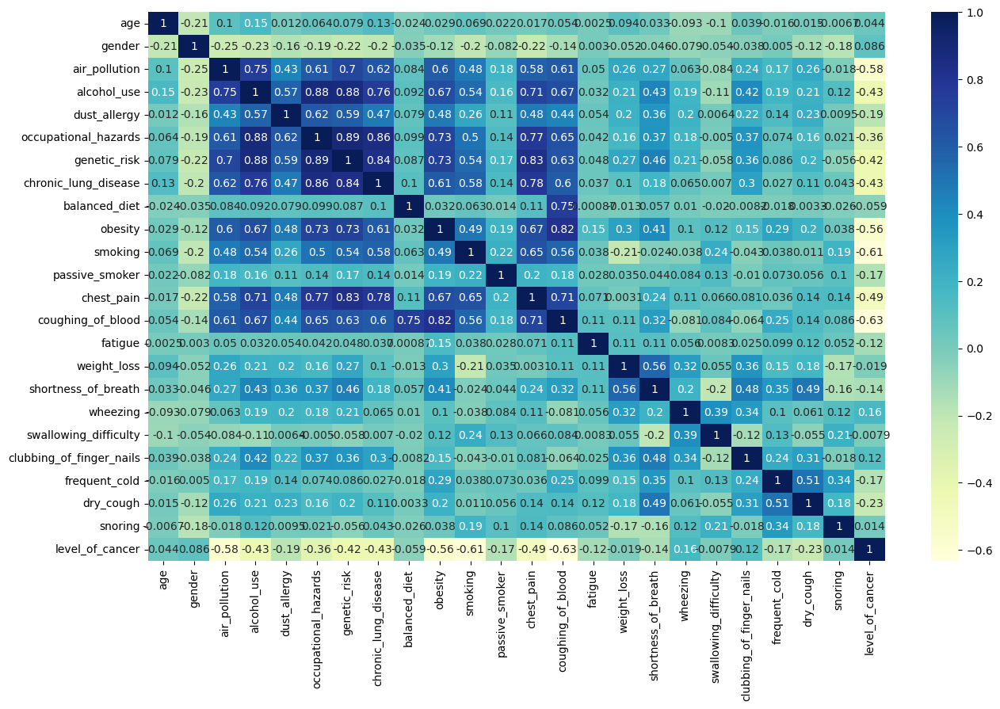

In [23]:
#Checking the correlation between our independant variables and our target variable using Correlation heatmap

plt.figure(figsize=(15, 9))
sns.heatmap(df.corr(), cmap="YlGnBu", annot=True)
plt.show() 

# From the above correlation heatmap it becomes clear that the high level_of_cancer are yellow cells (close to high=0) and if we take a treshold of +-0.5, we can select the following features as having the most impact on it

    1. Coughing_of_blood = -0.63
    2. smoking = -0.61
    3. air_pollution = -0.58
    4. obesity = -0.56

In [24]:
df.head()

,age,gender,air_pollution,alcohol_use,dust_allergy,occupational_hazards,genetic_risk,chronic_lung_disease,balanced_diet,obesity,...,fatigue,weight_loss,shortness_of_breath,wheezing,swallowing_difficulty,clubbing_of_finger_nails,frequent_cold,dry_cough,snoring,level_of_cancer
0,33.0,1.0,2.0,4.0,5.0,4.0,3.0,2,2.0,4.0,...,3.0,4.0,2.0,2.0,3.0,1.0,2.0,3,4,1
1,17.0,1.0,3.0,1.0,5.0,3.0,4.0,2,2.0,2.0,...,1.0,3.0,7.0,8.0,6.0,2.0,1.0,7,2,2
2,35.0,1.0,4.0,5.0,6.0,5.0,5.0,4,6.0,7.0,...,8.0,7.0,9.0,2.0,1.0,4.0,6.0,7,2,0
3,37.0,1.0,7.0,7.0,7.0,7.0,6.0,7,7.0,7.0,...,4.0,2.0,3.0,1.0,4.0,5.0,6.0,7,5,0
4,46.0,1.0,6.0,8.0,7.0,7.0,7.0,6,7.0,7.0,...,3.0,NaN,4.0,1.0,4.0,2.0,4.0,2,3,0


In [25]:
df.shape

(1000, 24)

# Now lets handle missing values and outliers in our new dataframe of interest

In [26]:
df.isnull().sum()

age                          3
gender                       6
air_pollution                9
alcohol_use                 12
dust_allergy                 7
occupational_hazards         6
genetic_risk                 6
chronic_lung_disease         0
balanced_diet                5
obesity                      8
smoking                      7
passive_smoker               4
chest_pain                   8
coughing_of_blood           13
fatigue                      5
weight_loss                  5
shortness_of_breath         10
wheezing                     6
swallowing_difficulty        7
clubbing_of_finger_nails     4
frequent_cold                3
dry_cough                    0
snoring                      0
level_of_cancer              0
dtype: int64

In [27]:
import warnings
warnings.filterwarnings('ignore')

# Let's visualize the distribution of our raw data with the four columns of interest using distplots

<AxesSubplot:xlabel='air_pollution', ylabel='Density'>

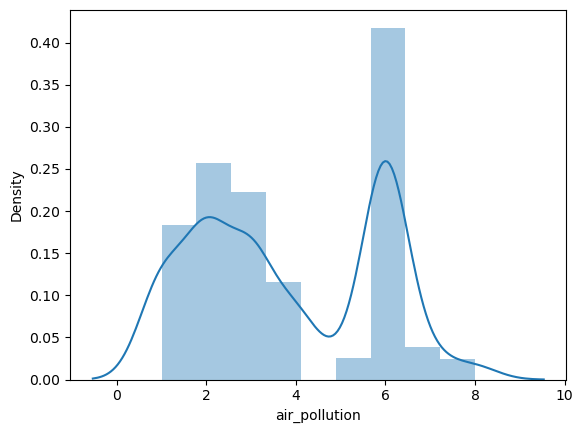

In [28]:
#air_pollution distplot
sns.distplot(df['air_pollution'])

<AxesSubplot:xlabel='obesity', ylabel='Density'>

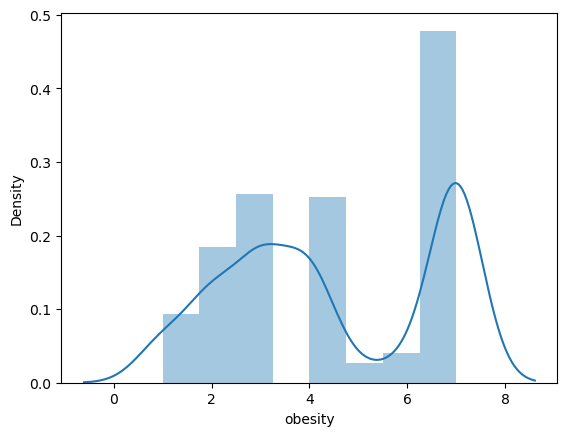

In [29]:
#obesity distplot
sns.distplot(df['obesity'])

<AxesSubplot:xlabel='smoking', ylabel='Density'>

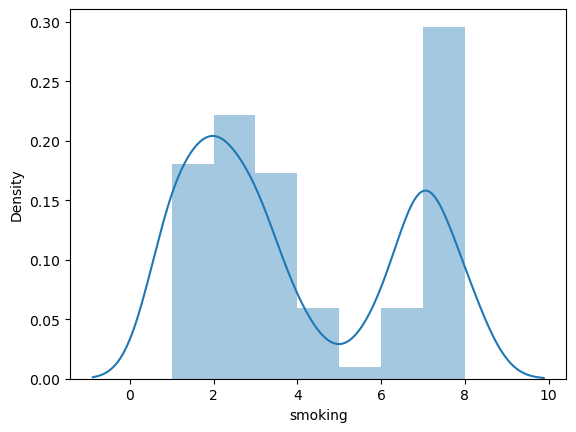

In [30]:
#smoking distplot
sns.distplot(df['smoking'])

<AxesSubplot:xlabel='coughing_of_blood', ylabel='Density'>

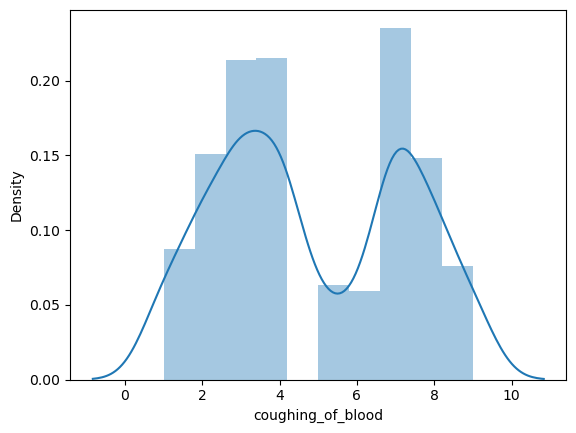

In [31]:
#coughing_of_blood distplot
sns.distplot(df['coughing_of_blood'])

In [32]:
#Creating a new dataframe with just 4 columns of interest
df= df[['air_pollution', 'obesity', 'smoking', 'coughing_of_blood', 'level_of_cancer']]

In [33]:
df.head()

,air_pollution,obesity,smoking,coughing_of_blood,level_of_cancer
0,2.0,4.0,3.0,4.0,1
1,3.0,2.0,2.0,3.0,2
2,4.0,7.0,2.0,8.0,0
3,7.0,7.0,7.0,8.0,0
4,6.0,7.0,8.0,9.0,0


# First pandas-profiling report on raw-data of four columns to check values such as mean/ std/skewness/Kutosis..

In [34]:
pp.ProfileReport(df) 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Box plot of Air pollution and Level of cancer

<AxesSubplot:xlabel='level_of_cancer', ylabel='air_pollution'>

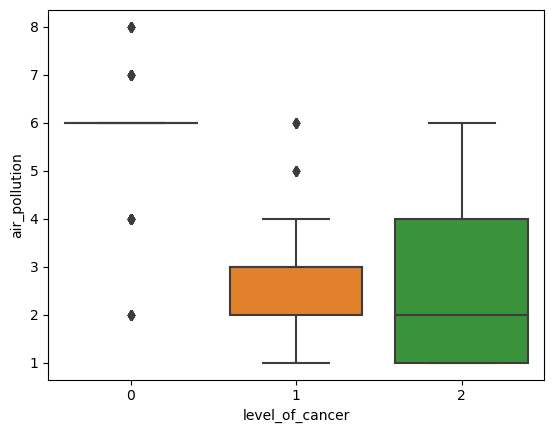

In [35]:
sns.boxplot(data=df, y='air_pollution', x= 'level_of_cancer')

# Box plot of Obesity and Level of cancer

<AxesSubplot:xlabel='level_of_cancer', ylabel='obesity'>

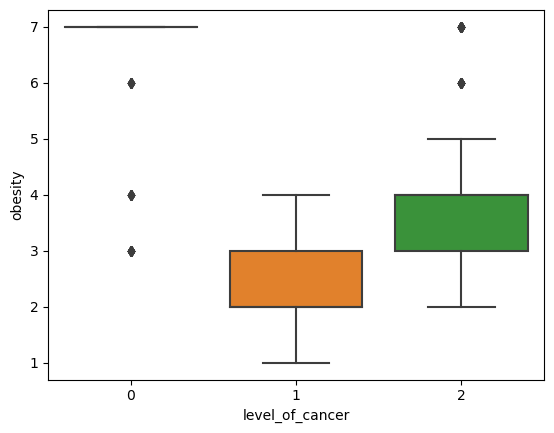

In [36]:
sns.boxplot(data=df, y='obesity', x= 'level_of_cancer')

# Box plot of Smoking and Level of cancer

<AxesSubplot:xlabel='level_of_cancer', ylabel='smoking'>

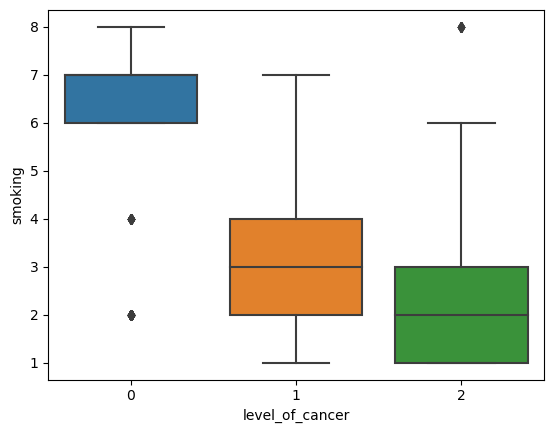

In [37]:
sns.boxplot(data=df, y='smoking', x= 'level_of_cancer')

# Box plot of Coughing of blood and Level of cancer

<AxesSubplot:xlabel='level_of_cancer', ylabel='coughing_of_blood'>

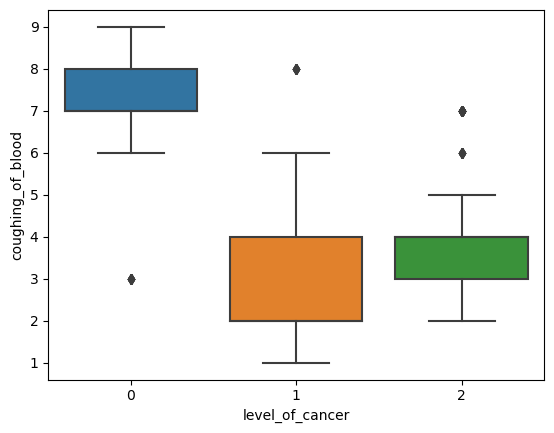

In [38]:
sns.boxplot(data=df, y='coughing_of_blood', x= 'level_of_cancer')

# With less than 2% missing values, we will impute them with median using SimpleImputer from sklearn

In [40]:
#Imputing missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)


# Re-check missing values

In [41]:
#Making sure null values are replaced with median
df.isnull().sum() 

air_pollution        0
obesity              0
smoking              0
coughing_of_blood    0
level_of_cancer      0
dtype: int64

# Second pandas-profiling report to display replaced missing values and thereby changes in other values such as mean/ std/skewness/Kutosis..

In [43]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [44]:
df.head()

,air_pollution,obesity,smoking,coughing_of_blood,level_of_cancer
0,2.0,4.0,3.0,4.0,1.0
1,3.0,2.0,2.0,3.0,2.0
2,4.0,7.0,2.0,8.0,0.0
3,7.0,7.0,7.0,8.0,0.0
4,6.0,7.0,8.0,9.0,0.0


In [45]:
#!pip install sklearn

In [46]:
from sklearn.preprocessing import StandardScaler


In [47]:
scaled_data= df.copy()

In [48]:
for col in ['air_pollution', 'obesity', 'smoking', 'coughing_of_blood']:
    scaled_data[col] = (scaled_data[col] - scaled_data[col].mean()) / scaled_data[col].std()

# Checking the new distributions of the four columns after finding the Z-scores ie after Standardizing our data with our new mean ~0

<AxesSubplot:xlabel='air_pollution', ylabel='Density'>

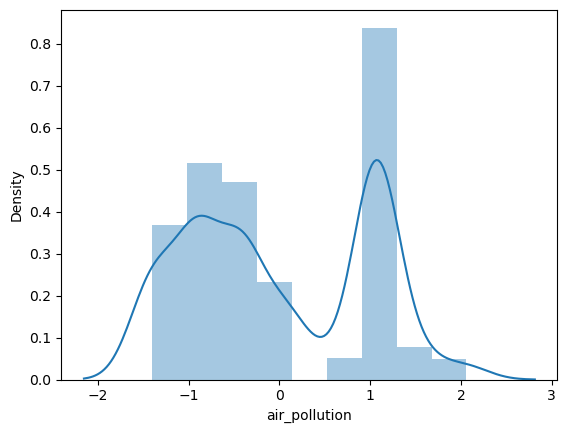

In [49]:
sns.distplot(scaled_data['air_pollution'])

<AxesSubplot:xlabel='obesity', ylabel='Density'>

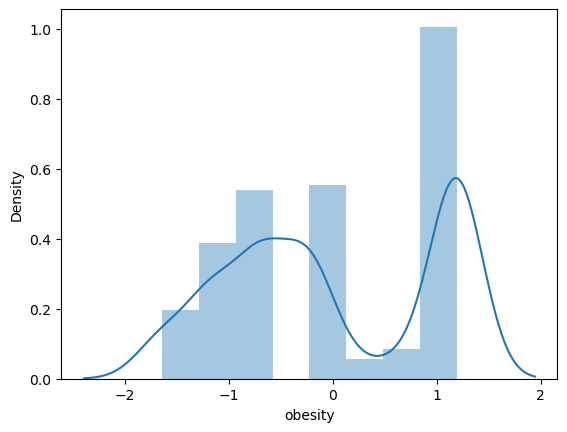

In [50]:
sns.distplot(scaled_data['obesity'])

<AxesSubplot:xlabel='smoking', ylabel='Density'>

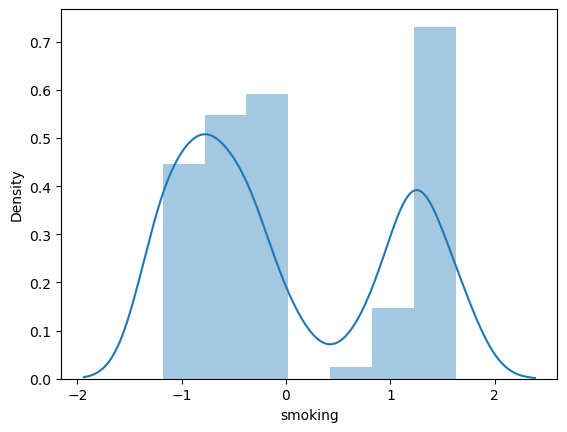

In [51]:
sns.distplot(scaled_data['smoking'])

<AxesSubplot:xlabel='coughing_of_blood', ylabel='Density'>

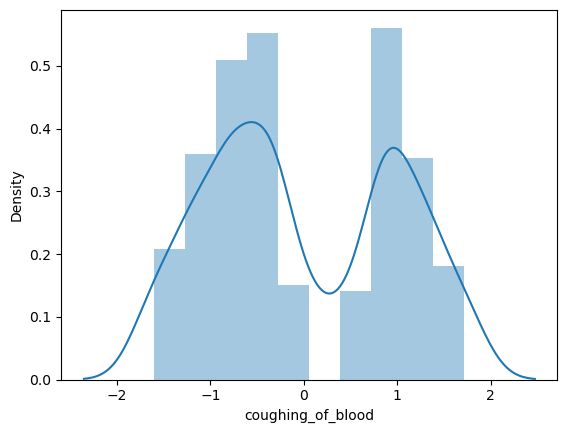

In [52]:
sns.distplot(scaled_data['coughing_of_blood'])

# Z-scores of the new dataframe

In [53]:
scaled_data

,air_pollution,obesity,smoking,coughing_of_blood,level_of_cancer
0,-0.903861,-0.223129,-0.379087,-0.354729,1.0
1,-0.409948,-1.166592,-0.781088,-0.769133,2.0
2,0.083965,1.192065,-0.781088,1.302884,0.0
3,1.565704,1.192065,1.228917,1.302884,0.0
4,1.071791,1.192065,1.630918,1.717288,0.0
...,...,...,...,...,...
995,1.071791,1.192065,1.228917,0.888481,0.0
996,1.071791,1.192065,1.228917,0.888481,0.0
997,0.083965,1.192065,-0.781088,1.302884,0.0
998,1.071791,1.192065,1.630918,1.717288,0.0


# Third pandas-profiling report to display changes in values such as mean/ std/skewness/Kutosis after finding the Z-scores

In [54]:
pp.ProfileReport(scaled_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]